In [1]:
import sys; sys.path.append('..')
import mitools as mt
import numpy as np
import seaborn as sns
from nilearn.datasets import fetch_atlas_aal
sns.set()

# Module mitools.image

In [2]:
path_to_img = '/media/fernando/HD/neuroimaging/ADNI/PET_fdg_protocol_3/selection_brain_evolution/data/002S0685_321228.nii'

In [3]:
# Methods and properties of mitools.image.NiftiContainer
nii_obj = mt.NiftiContainer(path_to_img, params={'key_1': 'value_1', 'key_2': 20})

nii_obj.params     # Access to input params specified by "params" in __init__
nii_obj.nifti_img  # Access to nifti image (see https://nipy.org/nibabel/reference/nibabel.nifti1.html#nibabel.nifti1.Nifti1Image for more information)
nii_obj.data       # Access to nifti data as numpy array
nii_obj.copy()     # Returns a deepcopy
nii_obj.save(file='./test.nii', overwrite=True)  # Save the image overwriting existing data
nii_obj.copy()     # Returns a deepcopy of the image

NiftiContainer

In [4]:
# Methods and properties of mitools.image.CachedNiftiContainer 
# (this class share the same methods and properties as class mitools.image.NiftiContainer)

# Specifying the parameter load as False we are avoiding the data to be in cache
nii_obj_c = mt.CachedNiftiContainer(path_to_img, load=False, params={'id': 32189})

nii_obj_c.is_cached     # False, the image is not in cache
nii_obj_c.load()        # Load the image into cache
nii_obj_c.is_cached     # True, the image is in cache
nii_obj_c.clearCache()  # Remove the image from the cache

In [5]:
# Additionally, this image saves changes that have been applied to the image by module functions. 
# This behaviour has been defined because as soon as the clearCache method is called, these changes are lost
nii_obj_c.modifications

# If anyway you want to remove all modifications when calling to clearCache() it is possible to specify
# te argument remove_mods as True
# ... Excute some function to modidify the image
nii_obj_c.clearCache(remove_mods=True)

In [6]:
# Update NiftiContainer data
print('Initial modifications:', nii_obj.modifications)
print('nii_obj.data[0, 0, 0] =', nii_obj.data[0, 0, 0])

nii_obj_upd = mt.image.updateData(nii_obj, np.random.uniform(size=nii_obj.shape))

print('nii_obj_upd.data[0, 0, 0] =', nii_obj_upd.data[0, 0, 0])
print('Modifications:', nii_obj_upd.modifications)

Initial modifications: []
nii_obj.data[0, 0, 0] = 0.0
nii_obj_upd.data[0, 0, 0] = 0.7949679917232092
Modifications: ['updateData']


In [7]:
# Resample shape to a reference image (shape)
print('Initial shape:', nii_obj.shape)
print('Initial affine:', nii_obj.nifti_img.affine, end='\n\n')

aal_atlas = mt.nifti.loadImg(fetch_atlas_aal().maps)   # Load nilearn aal atlas

print('AAL atlas shape:', aal_atlas.shape)
print('AAL atlas affine:', aal_atlas.affine, end='\n\n')

resampled_nii_obj = mt.image.resample(nii_obj, reference=aal_atlas)   # No changes in the affine transformation

print('Final shape:', resampled_nii_obj.shape)
print('Final affine:', resampled_nii_obj.nifti_img.affine)   

Initial shape: (160, 160, 96)
Initial affine: [[  -1.5     0.      0.    119.25]
 [   0.      1.5     0.   -119.25]
 [   0.      0.      1.5   -71.25]
 [   0.      0.      0.      1.  ]]

AAL atlas shape: (91, 109, 91)
AAL atlas affine: [[  -2.    0.    0.   90.]
 [   0.    2.    0. -126.]
 [   0.    0.    2.  -72.]
 [   0.    0.    0.    1.]]

Final shape: (91, 109, 91)
Final affine: [[  -1.5     0.      0.    119.25]
 [   0.      1.5     0.   -119.25]
 [   0.      0.      1.5   -71.25]
 [   0.      0.      0.      1.  ]]


In [8]:
# Resample to a reference image (shape + affine)
print('Initial shape:', nii_obj.shape)
print('Initial affine:', nii_obj.nifti_img.affine, end='\n\n')

aal_atlas = mt.nifti.loadImg(fetch_atlas_aal().maps)   # Load nilearn aal atlas

print('AAL atlas shape:', aal_atlas.shape)
print('AAL atlas affine:', aal_atlas.affine, end='\n\n')

resampled_nii_obj2 = mt.image.resampleToImg(nii_obj, reference=aal_atlas)   # Changing affine transformation

print('Final shape:', resampled_nii_obj2.shape)
print('Final affine:', resampled_nii_obj2.nifti_img.affine)   

Initial shape: (160, 160, 96)
Initial affine: [[  -1.5     0.      0.    119.25]
 [   0.      1.5     0.   -119.25]
 [   0.      0.      1.5   -71.25]
 [   0.      0.      0.      1.  ]]

AAL atlas shape: (91, 109, 91)
AAL atlas affine: [[  -2.    0.    0.   90.]
 [   0.    2.    0. -126.]
 [   0.    0.    2.  -72.]
 [   0.    0.    0.    1.]]

Final shape: (91, 109, 91)
Final affine: [[  -2.    0.    0.   90.]
 [   0.    2.    0. -126.]
 [   0.    0.    2.  -72.]
 [   0.    0.    0.    1.]]


In [9]:
# Change voxel size
print('Initial shape:', nii_obj.shape)
print('Initial affine:', nii_obj.nifti_img.affine, end='\n\n')

nii_obj_vx3 = mt.image.resampleVoxelSize(nii_obj, 3)

print('Final shape:', nii_obj_vx3.shape)
print('Final affine:', nii_obj_vx3.nifti_img.affine)   

Initial shape: (160, 160, 96)
Initial affine: [[  -1.5     0.      0.    119.25]
 [   0.      1.5     0.   -119.25]
 [   0.      0.      1.5   -71.25]
 [   0.      0.      0.      1.  ]]

Final shape: (81, 81, 49)
Final affine: [[   3.      0.      0.   -119.25]
 [   0.      3.      0.   -119.25]
 [   0.      0.      3.    -71.25]
 [   0.      0.      0.      1.  ]]


In [10]:
# Map function to images
def exp(i: int, arr: np.ndarray, optional_arg: str) -> tuple:
    """ The function must receive an integer in the first position and a 
    numpy array in the second position and return a tuple where the first 
    element must be the received integer and the second the modified array."""
    print('Optional args:', optional_arg)
    return i, np.exp(arr)

output = mt.image.mapFunctionToImg(
    img=[nii_obj, nii_obj_upd, nii_obj_vx3], 
    function=exp, 
    n_jobs=1,     # Parallel execution 
    optional_arg='optional argument')

Optional args: optional argument
Optional args: optional argument
Optional args: optional argument


# Module mitools.plot


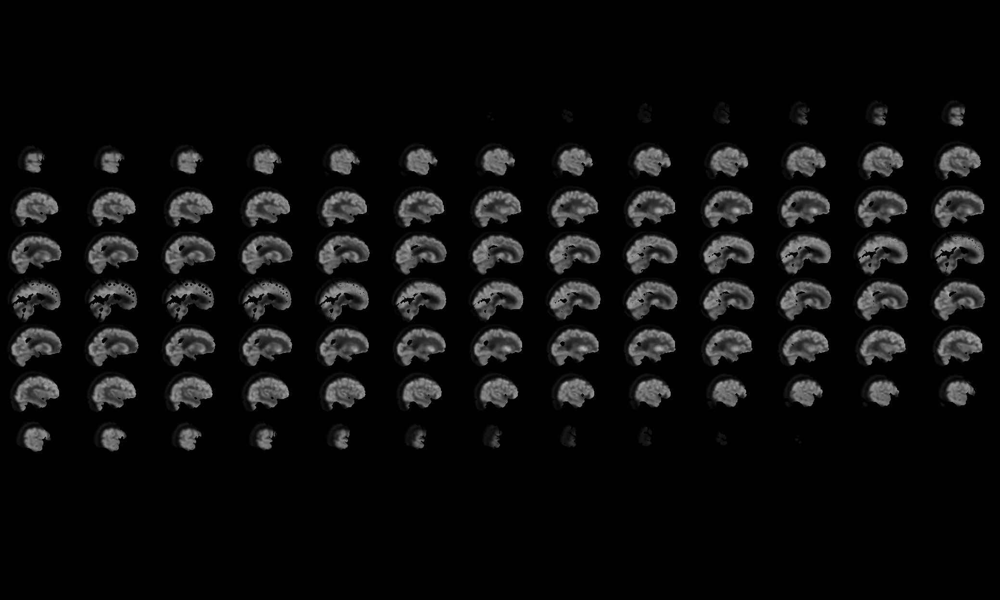
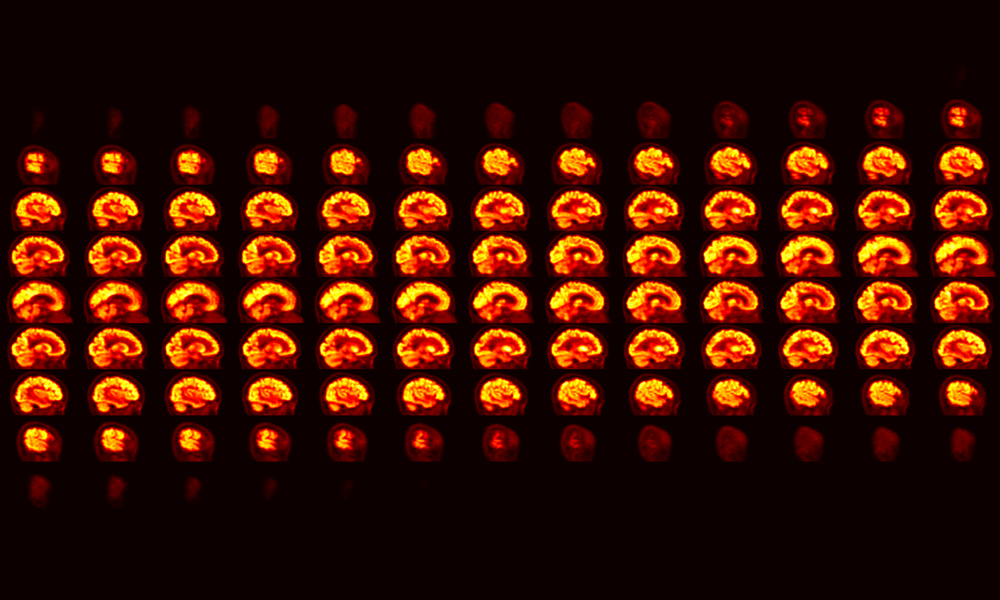

In [11]:
# Basic renderization of nifti images (dynamic)
mt.plot.render(nii_obj)

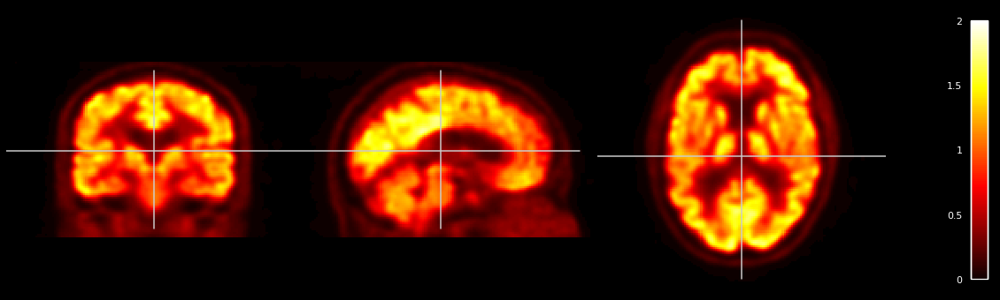

In [12]:
# Basic renderization of nifti images (satic)
mt.plot.render(nii_obj, backend='static')

In [13]:
# Render the image in a browser and using optional parameters
mt.plot.render(
    nii_obj,
    title='Values above 1.3',
    vmin=0.0, vmax=2.0,     # Maximum and minimum values of the colorbar
    annotate=True,          # Show the actual coordinates
    threshold=1.3,          # Values below 1.3 will be transparent
    open_in_browser=True,   # Open the image in a separate window
    save_html='test.html'   # Save the renderization as html
);

In [14]:
# Render the image in 3D
mt.plot.render3D(nii_obj)

# Module mitools.roi

In [15]:
# Extract ROIs from image (average values)
mt.roi.extractROIs(nii_obj, atlas='aal', aggregate='mean')

,0,1,2,3,4,5,6,7,8,9,...,106,107,108,109,110,111,112,113,114,115
0,0.599096,0.426709,0.747409,0.700241,0.909116,0.929074,0.886768,0.870032,1.105852,1.147995,...,0.870731,0.969604,0.845612,0.701321,1.292022,1.153687,0.591922,0.388232,0.790503,1.08996


In [16]:
# Extract ROIs from image using more than one aggregation (average, median)
mt.roi.extractROIs(
    [nii_obj, nii_obj],    # A list of images can be provided
    atlas='aal', aggregate=['mean', 'median'])

,0,1,2,3,4,5,6,7,8,9,...,106,107,108,109,110,111,112,113,114,115
0,0.599096,0.426709,0.747409,0.700241,0.909116,0.929074,0.886768,0.870032,1.105852,1.147995,...,0.870731,0.969604,0.845612,0.701321,1.292022,1.153687,0.591922,0.388232,0.790503,1.08996
1,0.599096,0.426709,0.747409,0.700241,0.909116,0.929074,0.886768,0.870032,1.105852,1.147995,...,0.870731,0.969604,0.845612,0.701321,1.292022,1.153687,0.591922,0.388232,0.790503,1.08996


In [17]:
# Available atlases
list(mt.roi.ATLASES.keys())

['aal', 'destrieux']

In [18]:
# Extract ROIs from an atlas that requires optional arguments
mt.roi.extractROIs([nii_obj], atlas='destrieux', aggregate='mean')

,0,1,2,3,4,5,6,7,8,9,...,138,139,140,141,142,143,144,145,146,147
0,0.828382,0.22737,0.156622,0.993868,1.054597,0.724044,1.263558,1.252502,1.334484,1.383434,...,0.645149,1.100728,0.29393,1.252244,0.553584,0.651929,0.965058,0.933088,0.900663,1.293673


In [19]:
# Get the number of voxels per region
mt.roi.getAtlasNumVoxels('aal')

,precentral_l,precentral_r,frontal_sup_l,frontal_sup_r,frontal_sup_orb_l,frontal_sup_orb_r,frontal_mid_l,frontal_mid_r,frontal_mid_orb_l,frontal_mid_orb_r,...,cerebelum_10_l,cerebelum_10_r,vermis_1_2,vermis_3,vermis_4_5,vermis_6,vermis_7,vermis_8,vermis_9,vermis_10
0,3526,3381,3599,4056,963,997,4863,5104,888,1015,...,144,159,53,228,665,371,194,243,174,112


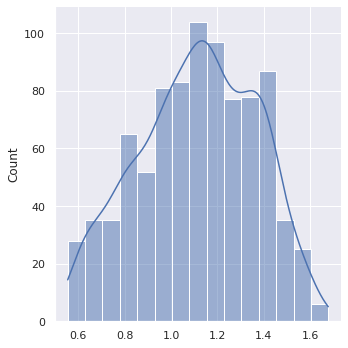

In [20]:
# Extract voxel values of a given ROI
voxel_dist = mt.roi.extractROIVoxels(nii_obj, atlas='aal', roi='frontal_mid_orb_l')
g = sns.displot(data=voxel_dist.values.squeeze(0), kde=True);